# EDA for Round 9 Attackers



## Dependences

In [4]:
%load_ext autotime
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

time: 27.8 ms (started: 2021-03-23 15:20:00 -03:00)


In [5]:
# Library dependences
import cloudpickle
import holoviews as hv
import plotly.express as px
import networkx as nx
import pandas as pd
import numpy as np

# Local dependences
#from model_gitcoin.parts.utils import plot_contributions
from qf_research.functions import total_amount
from qf_research.functions import contributions_to_graph
from qf_research.definitions import optimality_gap_per_grant
from qf_research.definitions import amount_per_grant

time: 7.08 s (started: 2021-03-23 15:20:01 -03:00)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
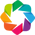

time: 1.89 s (started: 2021-03-23 15:20:08 -03:00)


In [6]:
hv.extension('bokeh')

## Load data from R9

In [7]:
PATH = '../data/2021-03-18/2021-03-18-round9-contributions.csv.xz'

time: 73.2 ms (started: 2021-03-23 15:20:10 -03:00)


In [8]:
df = (pd.read_csv(PATH, compression='xz')
        .query("success == True")
        .assign(created_on=lambda df: pd.to_datetime(df.created_on))
      )

time: 44.1 s (started: 2021-03-23 15:20:10 -03:00)


In [9]:
# Reverse engineer the simulation so that we don't need to run anything
list_of_contributions = list(df.to_dict(orient='index').values())
reverse_engineered_results = [list_of_contributions]

time: 1.31 s (started: 2021-03-23 15:20:54 -03:00)


## Overview of the graph

In [66]:
SUSPICIOUS_GRANTS = {'DropsEarn'}

SAFE_GRANTS = {'cadCAD: Computer Aided Design for Complex Systems',
               'EIP-1559 Community Fund',
               'Commons Simulator: Level Up'}

TRAINING_GRANTS = SUSPICIOUS_GRANTS | SAFE_GRANTS

time: 50 ms (started: 2021-03-23 15:39:42 -03:00)


In [67]:
y = df.groupby('contributor').amount.agg(['median', 'count', 'sum'])

time: 92.9 ms (started: 2021-03-23 15:39:42 -03:00)


In [122]:
C = 10
M = 2

inds = (y['count'] > C) & (y['median'] < M)

inds = df.contributor.isin(y[inds].index)
print(f"Contribution share: {len(df[inds]) / len(df) :.2%}")
print(f"Amount share: {df[inds].amount.sum() / df.amount.sum() :.2%}")

inds = (y['count'] > C) & (y['median'] < M)
print(f"User share: {len(y[inds]) / len(y) :.2%}")

Contribution share: 48.48%
Amount share: 13.90%
User share: 13.53%
time: 133 ms (started: 2021-03-23 16:06:21 -03:00)


In [123]:
df

,time_sequence,created_on,contributor,grant,amount,sybil_score,token,amount_in_token,success,flag
0,0,2021-03-09 23:59:02.658000-07:00,70b13b328c,Gitcoin Grants Round 9 + Dev Fund,4.957804,1,ETH,0.00280,True,0
1,1,2021-03-09 23:59:10.079000-07:00,963ac464f3,Zero Knowledge Podcast,0.950000,0,DAI,1.00000,True,0
2,2,2021-03-09 23:59:14.991000-07:00,ccebfd1e60,Gitcoin Grants Round 9 + Dev Fund,0.250000,1,DAI,0.25000,True,0
3,3,2021-03-09 23:59:20.639000-07:00,70b13b328c,Gitcoin Grants Round 9 + Dev Fund,0.248012,1,ETH,0.00014,True,0
4,4,2021-03-09 23:59:23.956000-07:00,5b7d5b422a,vfat.tools Yield Farming Calculators,1.770644,2,ETH,0.00100,True,0
...,...,...,...,...,...,...,...,...,...,...
80349,80349,2021-03-18 09:35:49.035000-06:00,d0eecbd79d,Illuminate Finance,0.000000,5,ETH,0.00050,True,0
80350,80350,2021-03-18 09:35:50.777000-06:00,d0eecbd79d,Gitcoin Grants Round 9 + Dev Fund,0.000000,5,ETH,0.00100,True,0
80351,80351,2021-03-18 09:36:06.510000-06:00,d0eecbd79d,Getting Started With NFTs - Video Tutorials on...,0.000000,0,ETH,0.00100,True,0
80352,80352,2021-03-18 09:36:08.260000-06:00,d0eecbd79d,Gitcoin Grants Round 9 + Dev Fund,0.000000,0,ETH,0.00005,True,0


time: 184 ms (started: 2021-03-23 16:09:59 -03:00)


In [20]:
G = contributions_to_graph(reverse_engineered_results[0])

time: 3.85 s (started: 2021-03-23 15:22:39 -03:00)


In [21]:
weighted_page_rank = nx.pagerank(G, weight='amount')

time: 43.2 s (started: 2021-03-23 15:22:43 -03:00)


In [22]:
page_rank_metrics = {'contributor_page_rank': df.contributor.map(weighted_page_rank),
                     'grant_page_rank': df.grant.map(weighted_page_rank)}

g_df = (df.assign(**page_rank_metrics)
          .assign(edge_page_rank=lambda df: df.grant_page_rank + df.contributor_page_rank))

time: 194 ms (started: 2021-03-23 15:23:26 -03:00)


In [30]:
y = g_df.groupby("contributor").agg(['mean', 'count', 'sum'])

px.scatter(x=y.amount['mean'],
           y=y.contributor_page_rank['mean'],
           size=np.log(y.amount['count']),
           color=np.log(y.amount['count']),
           log_x=True,
           log_y=True,
           labels={'x': 'Mean Amount per User (USDT)',
                   'y': 'User Weighted Page Rank'})

time: 603 ms (started: 2021-03-23 15:23:54 -03:00)


In [31]:
y = g_df.groupby("contributor").agg(['mean', 'count', 'sum', 'median'])

px.scatter(x=y.contributor_page_rank['mean'],
           y=y.grant_page_rank['mean'],
           size=np.log(y.amount['count']),
           color=np.log(y.amount['count']),
           log_x=True,
           log_y=True,
           labels={'x': 'User Weighted Page Rank',
                   'y': 'Median Grant Page Rank'})

time: 919 ms (started: 2021-03-23 15:24:13 -03:00)


In [25]:
y = g_df.groupby("contributor").agg(['mean', 'count', 'sum', 'median'])

px.scatter(x=y.contributor_page_rank['mean'],
           y=y.grant_page_rank['mean'],
           size=y.amount['count'],
           color=np.log(y.amount['count']),
           log_x=True,
           log_y=True,
           labels={'x': 'User Weighted Page Rank',
                   'y': 'Median Grant Page Rank'})

time: 1.1 s (started: 2021-03-23 15:23:30 -03:00)


In [26]:
px.scatter(g_df,
           x=g_df.edge_page_rank,
           y=g_df.grant_page_rank,
           color=g_df.token,
           log_x=True,
           log_y=True,
           labels={'x': 'User Weighted Page Rank',
                   'y': 'Median Grant Page Rank'})

time: 4.52 s (started: 2021-03-23 15:23:32 -03:00)


In [27]:
px.bar(g_df.groupby("token").amount.sum().sort_values(), log_y=True)

time: 322 ms (started: 2021-03-23 15:23:36 -03:00)


In [28]:

token_map_orig = {'DAI': 'USD',
            'USDC': 'USD',
            'USDT': 'USD',
            'PAN': 'PAN',
            'ETH': 'ETH',
            'WETH': 'ETH'}

token_map = {t: 'Other' for t in df.token.unique()}
token_map = {**token_map, **token_map_orig}
g_df_2 = g_df.assign(token=g_df.token.map(token_map))



time: 162 ms (started: 2021-03-23 15:23:36 -03:00)


In [54]:
y = g_df_2.groupby(["contributor", 'token']).agg(['mean', 'count', 'sum', 'median']).reset_index()

px.scatter(x=y.amount['mean'],
           y=y.contributor_page_rank['mean'],
           size=np.sqrt(y.amount['count']),
           color=y.token,
           opacity=0.5,
           log_x=True,
           log_y=True,
           labels={'x': 'User Weighted Page Rank',
                   'y': 'Median Grant Page Rank'})

time: 818 ms (started: 2021-03-23 15:31:57 -03:00)


In [60]:
px.histogram(np.log(y.amount['mean']), 
             facet_row=y.token,
             log_y=True)

time: 445 ms (started: 2021-03-23 15:35:51 -03:00)


In [124]:
np.e ** -2

0.1353352832366127

time: 77 ms (started: 2021-03-23 16:16:35 -03:00)


In [64]:
px.histogram(np.log(y.contributor_page_rank['mean']), 
             facet_row=y.token,
             log_y=True)

time: 750 ms (started: 2021-03-23 15:37:33 -03:00)
